In [1]:
import numpy as np
import pandas as pd

In [2]:
df = pd.read_csv(
    "https://raw.githubusercontent.com/Himanshu-1703/reddit-sentiment-analysis/refs/heads/main/data/reddit.csv"
)
df.head()

,clean_comment,category
0,family mormon have never tried explain them t...,1
1,buddhism has very much lot compatible with chr...,1
2,seriously don say thing first all they won get...,-1
3,what you have learned yours and only yours wha...,0
4,for your own benefit you may want read living ...,1


In [3]:
df.shape

(37249, 2)

In [4]:
df['category'].value_counts()

category
 1    15830
 0    13142
-1     8277
Name: count, dtype: int64

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37249 entries, 0 to 37248
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   clean_comment  37149 non-null  object
 1   category       37249 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 582.1+ KB


In [ ]:
# checking for missing values 
df.isnull().sum()

clean_comment    100
category           0
dtype: int64

In [12]:
df[df['clean_comment'].isnull()]

,clean_comment,category
413,NaN,0
605,NaN,0
2422,NaN,0
2877,NaN,0
3307,NaN,0
...,...,...
35975,NaN,0
36036,NaN,0
37043,NaN,0
37111,NaN,0


In [13]:
# dropping null values from dataset
df.dropna(inplace=True)

In [14]:
df.isnull().sum()

clean_comment    0
category         0
dtype: int64

In [17]:
df.duplicated().sum()

np.int64(350)

In [18]:
df[df.duplicated()]

,clean_comment,category
375,,0
392,,0
617,aurum mom,0
651,,0
1222,,0
...,...,...
36915,who won,0
37044,,0
37125,hari,0
37158,top kek,1


In [19]:
# dropping duplicates rows from dataset
df.drop_duplicates(inplace=True)

In [23]:
df = df[~(df['clean_comment'].str.strip() == '')]

In [24]:
# coverting clean_comment Col to lower_case 
df['clean_comment'] = df['clean_comment'].str.lower()

# check the comments after the above operation
df.sample(10)

,clean_comment,category
25821,the election commission will finally have some...,-1
16180,will double the rss membership overnight,0
15269,mass murderer doesn give fuck about courts,-1
27224,currently have power centers modi shah and gan...,1
12968,owaisi should teach his brother some history l...,1
14321,modi jee please cut down h1b fraud from india ...,-1
14698,the link last the article says similarly state...,1
18349,hate speech the heads,-1
9009,deleted 9713 what this,0
25049,the country has been fucking stupid for quite ...,-1


In [28]:
# check for leading and trailing spaces
df[df['clean_comment'].apply(lambda x: x.startswith(' ') or x.endswith(' '))]

,clean_comment,category
0,family mormon have never tried explain them t...,1
1,buddhism has very much lot compatible with chr...,1
2,seriously don say thing first all they won get...,-1
3,what you have learned yours and only yours wha...,0
4,for your own benefit you may want read living ...,1
...,...,...
37241,let the janta decide not ulema clerics,0
37242,hona hai same with vaccination education insu...,0
37246,downvote karna tha par upvote hogaya,0
37247,haha nice,1


In [29]:
df['clean_comment'] = df['clean_comment'].str.strip()

In [30]:
df[df["clean_comment"].apply(lambda x: x.startswith(" ") or x.endswith(" "))]

,clean_comment,category


In [36]:
# identifying those comments with urls

url_pattern = r"http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\\(\\),]|(?:%[0-9a-zA-z][0-9a-zA-Z]))+"
# url_pattern = r"http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\\(\\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+"
comments_with_urls = df[df['clean_comment'].str.contains(url_pattern, regex=True)]

comments_with_urls.head()

,clean_comment,category


In [37]:
# Identify comments containing new line characters
comments_with_newline = df[df["clean_comment"].str.contains("\n")]

# Display the comments containing new line characters
comments_with_newline.head()

,clean_comment,category
448,what missing jpg\nand why this brilliant edit ...,1
781,india has been ruined congress and populist sc...,-1
847,like aap for its stand corruption and making p...,-1
871,reduced trade\ndeficit stronger rupee aren the...,0
1354,amsa press conference australian maritime safe...,1


In [38]:
# Remove new line characters from the 'clean_comment' column
df["clean_comment"] = df["clean_comment"].str.replace("\n", " ", regex=True)

# Verify the transformation by checking for any remaining new lines
comments_with_newline_remaining = df[df["clean_comment"].str.contains("\n")]

comments_with_newline_remaining

,clean_comment,category


## EDA

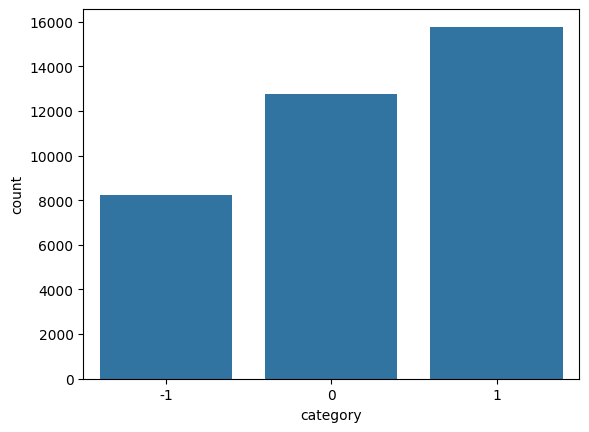

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

# distribution of classes
sns.countplot(data=df, x="category")
plt.show()

In [41]:
# frequency distribution of sentiments

df["category"].value_counts(normalize=True).mul(100).round(2)

category
 1    42.86
 0    34.71
-1    22.42
Name: proportion, dtype: float64

In [43]:
df["word_count"] = df["clean_comment"].apply(lambda x: len(x.split()))

In [50]:
df.sample(5)

,clean_comment,category,word_count
17774,yeah losing the plot here india get anything a...,0,12
32343,modi’ trolls our full force,1,5
27814,long you people don away with your deep state ...,-1,20
22638,some views,0,2
5051,thanks would give you gold but broke thank you,1,9


In [51]:
df["word_count"].describe()

count    36793.000000
mean        29.667464
std         56.790738
min          1.000000
25%          6.000000
50%         13.000000
75%         30.000000
max       1307.000000
Name: word_count, dtype: float64

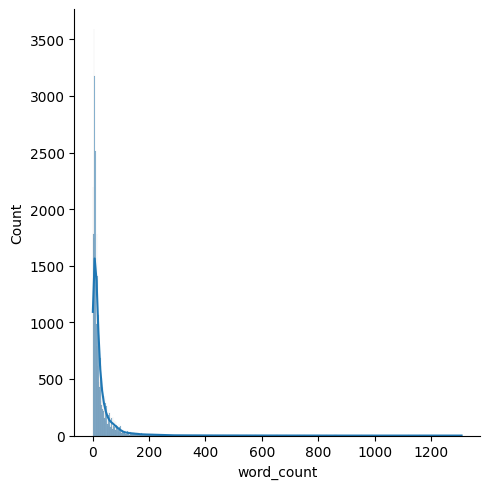

In [52]:
sns.displot(df["word_count"], kde=True)
plt.show()

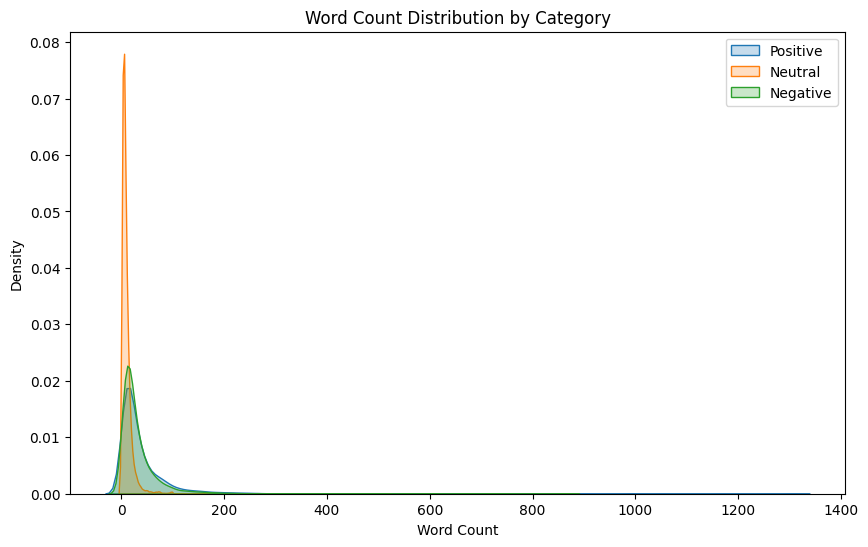

In [53]:
# Create the figure and axes
plt.figure(figsize=(10, 6))

# Plot KDE for category 1
sns.kdeplot(df[df["category"] == 1]["word_count"], label="Positive", fill=True)

# Plot KDE for category 0
sns.kdeplot(df[df["category"] == 0]["word_count"], label="Neutral", fill=True)

# Plot KDE for category -1
sns.kdeplot(df[df["category"] == -1]["word_count"], label="Negative", fill=True)

# Add title and labels
plt.title("Word Count Distribution by Category")
plt.xlabel("Word Count")
plt.ylabel("Density")

# Add a legend
plt.legend()

# Show the plot
plt.show()

**Positive comments (category 1)**: These tend to have a wider spread in word count, indicating that longer comments are more common in positive sentiments.<br>
**Neutral comments (category 0)**: The distribution shows a relatively lower frequency and is more concentrated around shorter comments compared to positive or negative ones.<br>
**Negative comments (category -1)**: These comments have a distribution somewhat similar to positive comments but with a smaller proportion of longer comments.

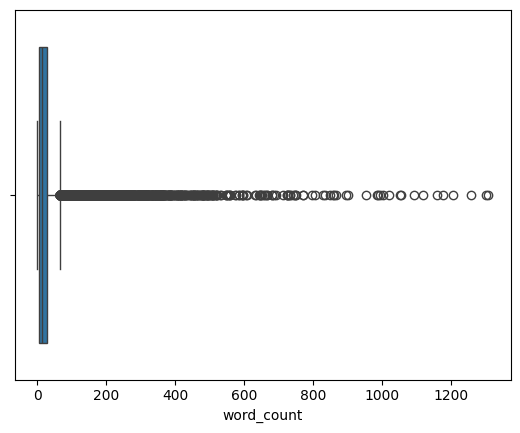

In [56]:
sns.boxplot(df['word_count'], orient='h')
plt.show()

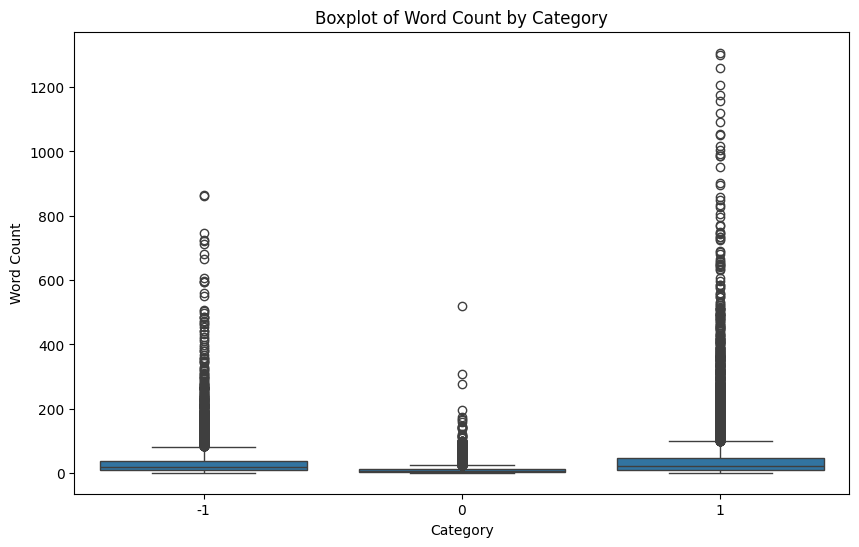

In [57]:
# Create a boxplot for the 'wordcount' column categorized by 'category'
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="category", y="word_count")
plt.title("Boxplot of Word Count by Category")
plt.xlabel("Category")
plt.ylabel("Word Count")
plt.show()

**Positive comments (category 1)**: The median word count is relatively high, and there are several outliers with longer comments, indicating that positive comments tend to be more verbose.<br>
**Neutral comments (category 0)**: The median word count is the lowest, with a tighter interquartile range (IQR), suggesting that neutral comments are generally shorter.<br>
**Negative comments (category -1)**: The word count distribution is similar to positive comments but with a slightly lower median and fewer extreme outliers.

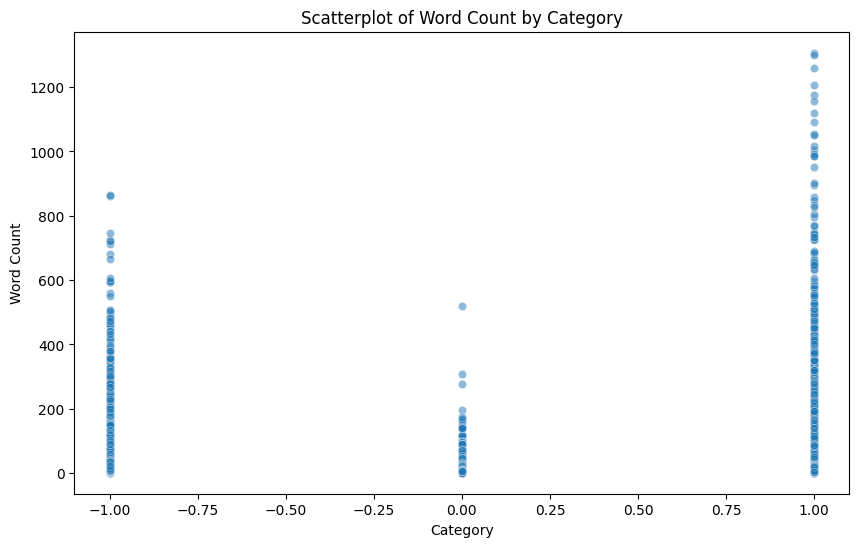

In [58]:
# Create a scatterplot between 'category' and 'wordcount'
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x="category", y="word_count", alpha=0.5)
plt.title("Scatterplot of Word Count by Category")
plt.xlabel("Category")
plt.ylabel("Word Count")
plt.show()

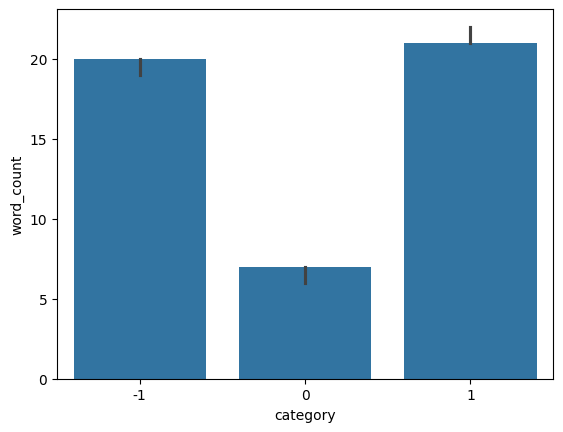

In [62]:
# median word counts among sentiments

sns.barplot(df, x="category", y="word_count", estimator="median")
plt.show()

In [64]:
from nltk.corpus import stopwords

# download NLTK stopwords 
import nltk 
nltk.download('stopwords')

stop_words = set(stopwords.words('english'))

df['num_of_stopwords']  = df['clean_comment'].apply(lambda x: len([word for word in x.split() if word in stop_words]))

df.sample(5)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Param\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,clean_comment,category,word_count,num_of_stopwords
28025,toi shit stopped subscription about years ago ...,1,11,1
5779,couldn agree more with the author media not tr...,-1,68,25
12232,looking for ahmadinejad,0,3,1
31404,yeh banenge,0,2,0
26021,gutesci marlhi daud uai medder dugianam quifal...,-1,237,29


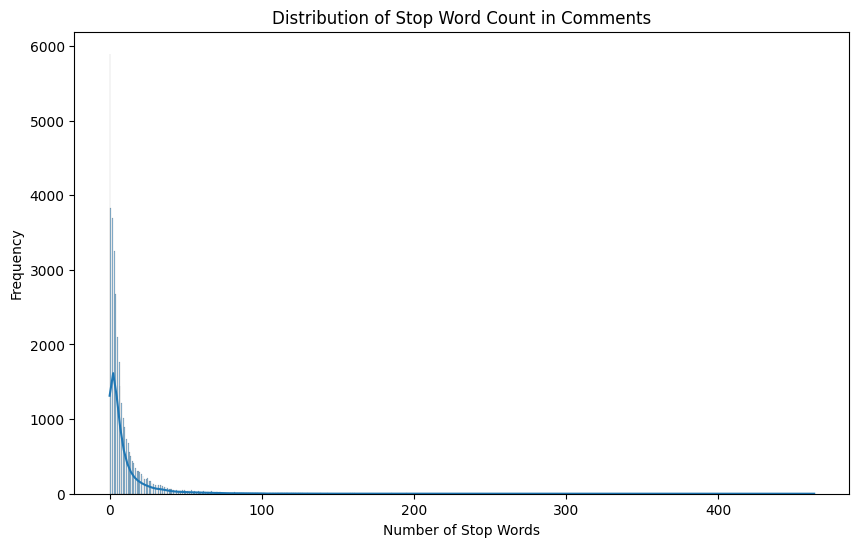

In [66]:
# Create a distribution plot (displot) for the 'num_of_stopwords' column
plt.figure(figsize=(10, 6))
sns.histplot(df["num_of_stopwords"], kde=True)
plt.title("Distribution of Stop Word Count in Comments")
plt.xlabel("Number of Stop Words")
plt.ylabel("Frequency")
plt.show()

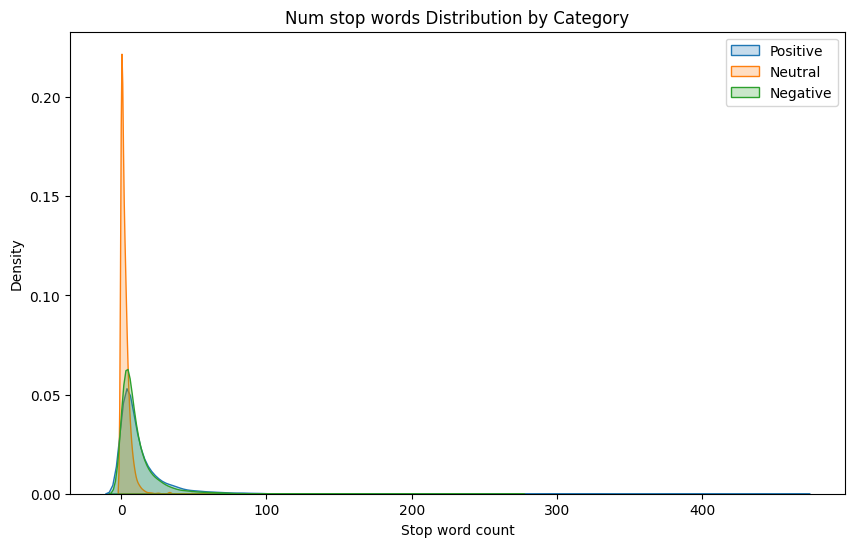

In [67]:
# Create the figure and axes
plt.figure(figsize=(10, 6))

# Plot KDE for category 1
sns.kdeplot(df[df["category"] == 1]["num_of_stopwords"], label="Positive", fill=True)

# Plot KDE for category 0
sns.kdeplot(df[df["category"] == 0]["num_of_stopwords"], label="Neutral", fill=True)

# Plot KDE for category -1
sns.kdeplot(df[df["category"] == -1]["num_of_stopwords"], label="Negative", fill=True)

# Add title and labels
plt.title("Num stop words Distribution by Category")
plt.xlabel("Stop word count")
plt.ylabel("Density")

# Add a legend
plt.legend()

# Show the plot
plt.show()

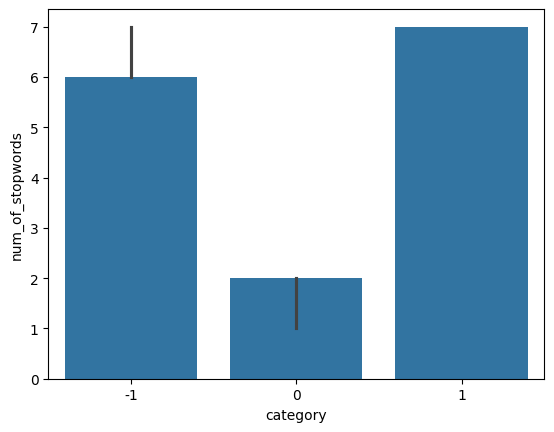

In [68]:
# median word counts among sentiments

sns.barplot(df,x='category',y='num_of_stopwords',estimator='median')
plt.show()

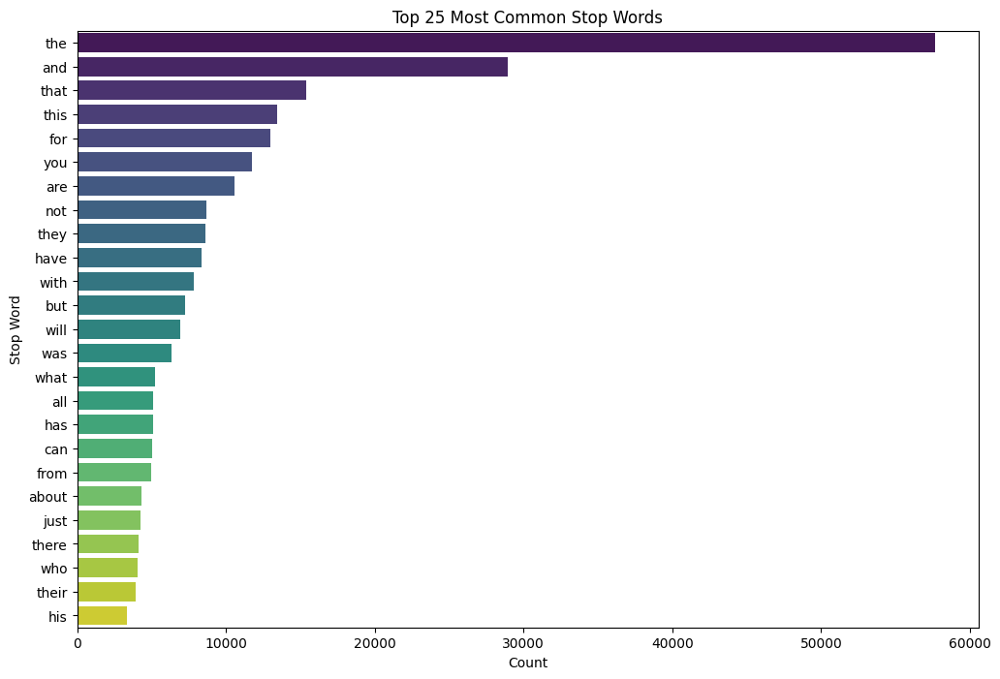

In [71]:
# Create a frequency distribution of stop words in the 'clean_comment' column
from collections import Counter

# Extract all stop words from the comments using the previously defined 'common_stopwords'
all_stop_words = [
    word for comment in df["clean_comment"] for word in comment.split() if word in stop_words
]

# Count the most common stop words
most_common_stop_words = Counter(all_stop_words).most_common(25)

# Convert the most common stop words to a DataFrame for plotting
top_25_df = pd.DataFrame(most_common_stop_words, columns=["most_common_stopwords", "count"])

# Create the barplot for the top 25 most common stop words
plt.figure(figsize=(12, 8))
sns.barplot(
    data=top_25_df,
    x="count",
    y="most_common_stopwords",
    palette="viridis",
    hue="most_common_stopwords",
)
plt.title("Top 25 Most Common Stop Words")
plt.xlabel("Count")
plt.ylabel("Stop Word")
plt.show()

In [73]:
df['num_of_chars'] = df['clean_comment'].apply(len)

df.sample(5)

,clean_comment,category,word_count,num_of_stopwords,num_of_chars
10869,this true for bihari people too,1,6,3,31
20352,what grounds was arrested,0,4,2,25
4881,what made you think shelterer mass murderers w...,1,77,34,453
10566,this sadly sounds like the ending 1984,-1,7,2,38
22840,this author really have cute short series ooka...,1,19,8,110


In [74]:
df['num_of_chars'].describe()

count    36793.000000
mean       181.852798
std        359.702163
min          1.000000
25%         38.000000
50%         80.000000
75%        184.000000
max       8664.000000
Name: num_of_chars, dtype: float64

In [87]:
from collections import Counter

# Combine all comments into one large string
all_text = " ".join(df["clean_comment"])

# Count the frequency of each character
char_frequency = Counter(all_text)

# # Convert the character frequency into a DataFrame for better display
char_frequency_df = pd.DataFrame(
    char_frequency.items(), columns=["character", "frequency"]
).sort_values(by="frequency", ascending=True)

In [95]:
char_frequency_df.tail(10)

,character,frequency
10,h,296748
8,r,331425
17,s,355279
7,o,379908
9,n,388465
3,i,401388
1,a,481134
13,t,491287
12,e,666610
6,,1091592


In [93]:
char_frequency_df[(char_frequency_df['frequency'] == 1)]

,character,frequency
577,✓,1
580,ெ,1
581,ய,1
583,☠,1
569,ವ,1
...,...,...
1347,☝,1
1348,ね,1
1349,ゃ,1
1350,ూ,1


In [96]:
# Create a new column 'num_punctuation_chars' to count punctuation characters in each comment
df["num_punctuation_chars"] = df["clean_comment"].apply(
    lambda x: sum([1 for char in x if char in ".,!?;:\"'()[]{}-"])
)

df.sample(5)

,clean_comment,category,word_count,num_of_stopwords,num_of_chars,num_punctuation_chars
5082,were 1947 500 tiny princely states and major s...,1,92,41,570,0
20415,tamil nadu,0,2,0,10,0
8997,autist,0,1,0,6,0
1967,jackie taking one the face,0,5,1,26,0
20861,the eight year old was gangraped thrice inside...,1,98,33,599,0


In [97]:
df["num_punctuation_chars"].describe()

count    36793.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: num_punctuation_chars, dtype: float64

In [104]:
df.head()

,clean_comment,category,word_count,num_of_stopwords,num_of_chars,num_punctuation_chars
0,family mormon have never tried explain them th...,1,39,13,259,0
1,buddhism has very much lot compatible with chr...,1,196,59,1268,0
2,seriously don say thing first all they won get...,-1,86,40,459,0
3,what you have learned yours and only yours wha...,0,29,15,167,0
4,for your own benefit you may want read living ...,1,112,45,690,0


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer(ngram_range=(2,2), stop_words='english')
cv.fit(df['clean_comment'])

bag_of_words =  cv.transform(df['clean_comment'])

bag_of_words.sum(axis=0)

[matrix([[19,  2,  1, ...,  1,  1,  1]])]

In [107]:
cv.vocabulary_.items()

dict_items([('family mormon', 144104), ('mormon tried', 276779), ('tried explain', 434489), ('explain stare', 139622), ('stare puzzled', 398642), ('puzzled time', 338485), ('time time', 428385), ('time like', 427910), ('like kind', 242025), ('kind strange', 227396), ('strange creature', 403832), ('creature nonetheless', 95387), ('nonetheless come', 290173), ('come admire', 77516), ('admire patience', 12676), ('patience calmness', 307699), ('calmness equanimity', 59671), ('equanimity acceptance', 134244), ('acceptance compassion', 8124), ('compassion developed', 81581), ('developed things', 111015), ('things buddhism', 422534), ('buddhism teaches', 55962), ('buddhism lot', 55940), ('lot compatible', 250768), ('compatible christianity', 81610), ('christianity especially', 71731), ('especially considering', 134921), ('considering sin', 86562), ('sin suffering', 387015), ('suffering thing', 408127), ('thing suffering', 422360), ('suffering caused', 408080), ('caused wanting', 64458), ('wan

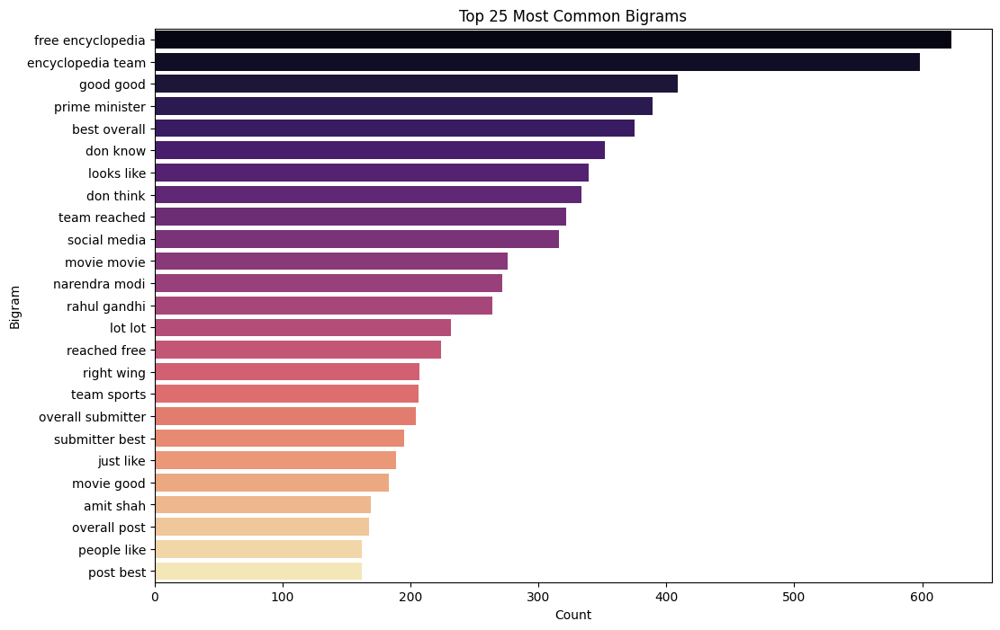

In [109]:
from sklearn.feature_extraction.text import CountVectorizer


# Create a function to extract the top 25 bigrams
def get_top_ngrams(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words="english").fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]


# Get the top 25 bigrams
top_25_bigrams = get_top_ngrams(df["clean_comment"], 25)

# Convert the bigrams into a DataFrame for plotting
top_25_bigrams_df = pd.DataFrame(top_25_bigrams, columns=["bigram", "count"])

# Plot the countplot for the top 25 bigrams
plt.figure(figsize=(12, 8))
sns.barplot(data=top_25_bigrams_df, x="count", y="bigram", palette="magma", hue='bigram')
plt.title("Top 25 Most Common Bigrams")
plt.xlabel("Count")
plt.ylabel("Bigram")
plt.show()

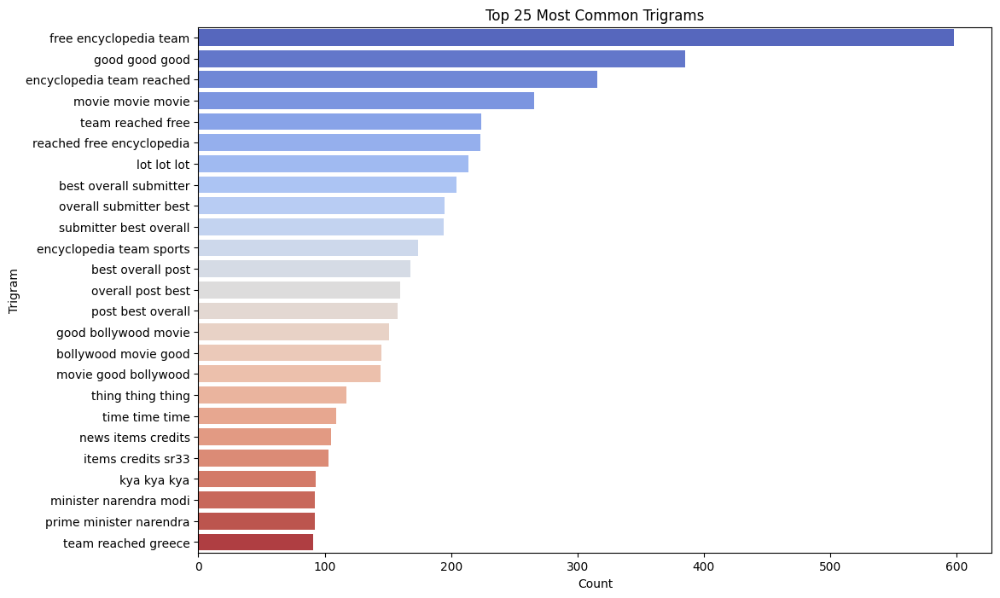

In [110]:
# Create a function to extract the top 25 trigrams
def get_top_trigrams(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3), stop_words="english").fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]


# Get the top 25 trigrams
top_25_trigrams = get_top_trigrams(df["clean_comment"], 25)

# Convert the trigrams into a DataFrame for plotting
top_25_trigrams_df = pd.DataFrame(top_25_trigrams, columns=["trigram", "count"])

# Plot the countplot for the top 25 trigrams
plt.figure(figsize=(12, 8))
sns.barplot(data=top_25_trigrams_df, x="count", y="trigram", palette="coolwarm", hue='trigram')
plt.title("Top 25 Most Common Trigrams")
plt.xlabel("Count")
plt.ylabel("Trigram")
plt.show()

In [111]:
# Remove non-English characters from the 'clean_comment' column
# Keeping only standard English letters, digits, and common punctuation
import re

df["clean_comment"] = df["clean_comment"].apply(
    lambda x: re.sub(r"[^A-Za-z0-9\s!?.,]", "", str(x))
)

In [112]:
from nltk.corpus import stopwords

# Defining stop words but keeping essential ones for sentiment analysis
stop_words = set(stopwords.words("english")) - {"not", "but", "however", "no", "yet"}

# Remove stop words from 'clean_comment' column, retaining essential ones
df["clean_comment"] = df["clean_comment"].apply(
    lambda x: " ".join([word for word in x.split() if word.lower() not in stop_words])
)

In [113]:
df.sample(5)

,clean_comment,category,word_count,num_of_stopwords,num_of_chars,num_punctuation_chars
28217,care not even single person killed but thing w...,-1,39,14,236,0
7033,bassi figure parody account real account real ...,1,18,5,103,0
32659,sad government immediately pay salaries staff ...,-1,19,9,117,0
27146,duke spa formerly king spa ecoland discreet,0,8,1,48,0
19184,english language equivalent ravish india,0,6,1,46,0


In [117]:
from nltk.stem import WordNetLemmatizer

nltk.download("wordnet")

# Define the lemmatizer
lemmatizer = WordNetLemmatizer()

# Apply lemmatization to the 'clean_comment_no_stopwords' column
df["clean_comment"] = df["clean_comment"].apply(
    lambda x: " ".join([lemmatizer.lemmatize(word) for word in x.split()])
)

df.head()

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Param\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


,clean_comment,category,word_count,num_of_stopwords,num_of_chars,num_punctuation_chars
0,family mormon never tried explain still stare ...,1,39,13,259,0
1,buddhism much lot compatible christianity espe...,1,196,59,1268,0
2,seriously say thing first get complex explain ...,-1,86,40,459,0
3,learned want teach different focus goal not wr...,0,29,15,167,0
4,benefit may want read living buddha living chr...,1,112,45,690,0


In [116]:
' '.join([lemmatizer.lemmatize(word) for word in df['clean_comment'][0].split()])

'family mormon never tried explain still stare puzzled time time like kind strange creature nonetheless come admire patience calmness equanimity acceptance compassion developed thing buddhism teach'

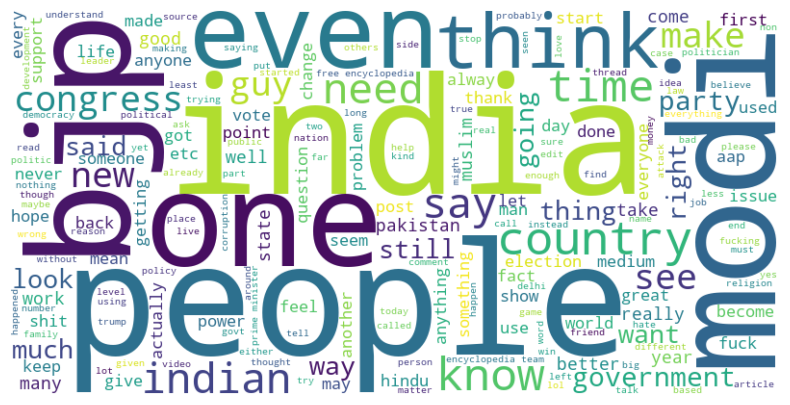

In [118]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def plot_word_cloud(text):
    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(text))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()


plot_word_cloud(df["clean_comment"])

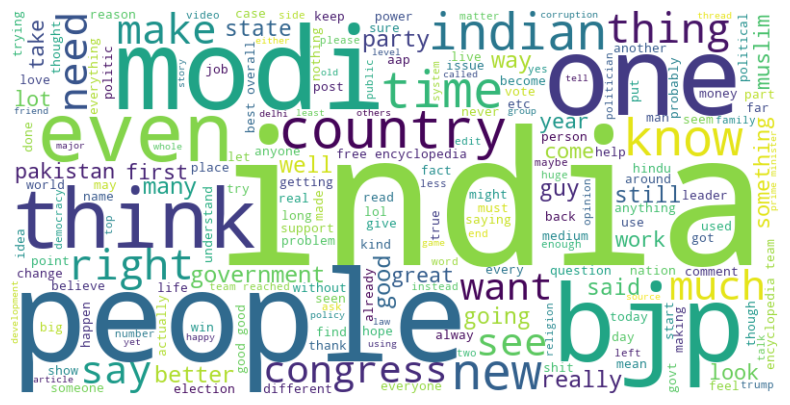

In [119]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt


def plot_word_cloud(text):
    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(text))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()


plot_word_cloud(df[df["category"] == 1]["clean_comment"])

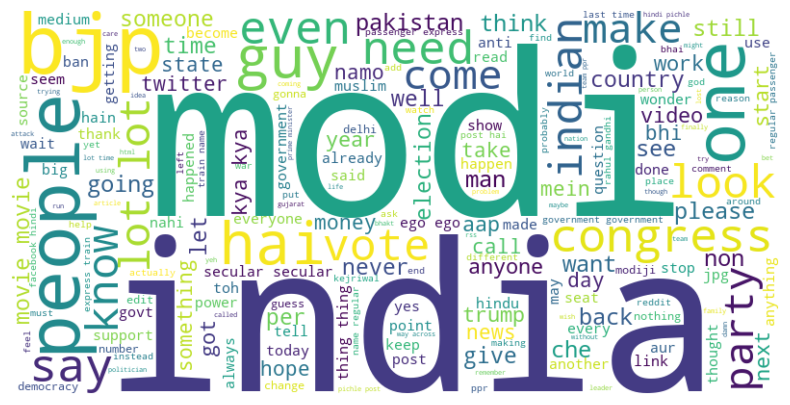

In [120]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt


def plot_word_cloud(text):
    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(text))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()


plot_word_cloud(df[df["category"] == 0]["clean_comment"])

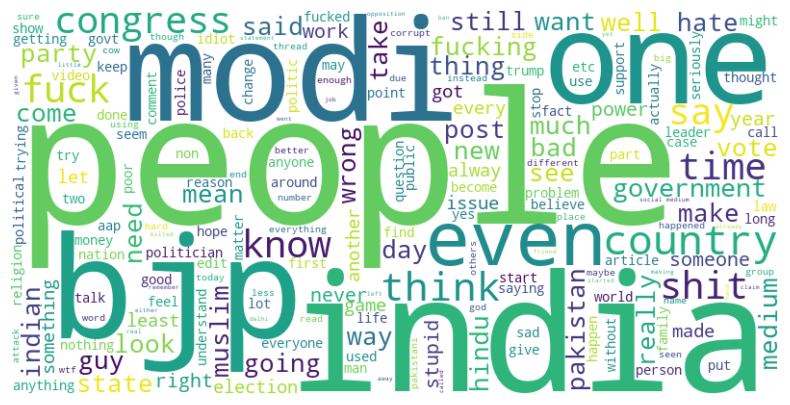

In [121]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt


def plot_word_cloud(text):
    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(text))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()


plot_word_cloud(df[df["category"] == -1]["clean_comment"])

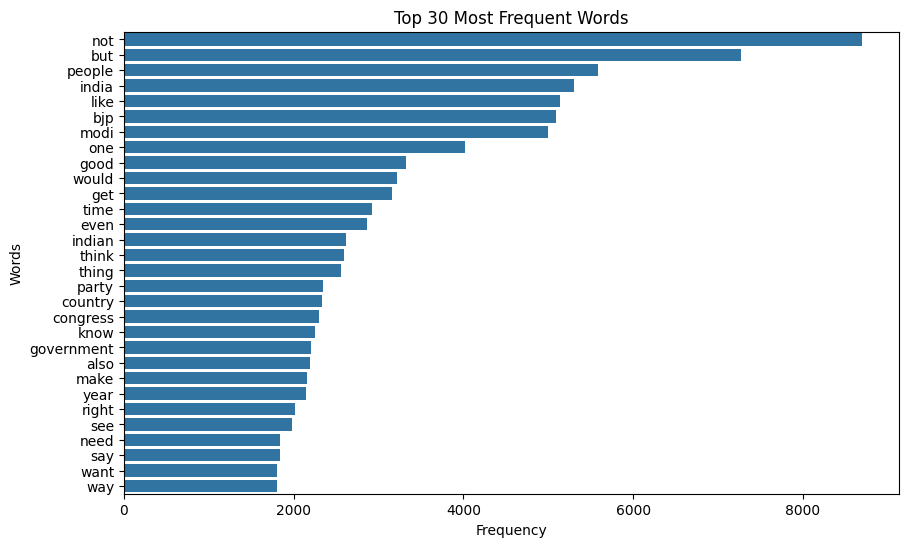

In [123]:
def plot_top_n_words(df, n=20):
    """Plot the top N most frequent words in the dataset."""
    # Flatten all words in the content column
    words = " ".join(df["clean_comment"]).split()

    # Get the top N most common words
    counter = Counter(words)
    most_common_words = counter.most_common(n)

    # Split the words and their counts for plotting
    words, counts = zip(*most_common_words)

    # Plot the top N words
    plt.figure(figsize=(10, 6))
    sns.barplot(x=list(counts), y=list(words))
    plt.title(f"Top {n} Most Frequent Words")
    plt.xlabel("Frequency")
    plt.ylabel("Words")
    plt.show()


# Example usage
plot_top_n_words(df, n=30)

In [127]:
words = " ".join(df["clean_comment"]).split()

# Get the top N most common words
counter = Counter(words)
most_common_words = counter.most_common(20)

words, count = zip(*most_common_words)

words, count

(('not',
  'but',
  'people',
  'india',
  'like',
  'bjp',
  'modi',
  'one',
  'good',
  'would',
  'get',
  'time',
  'even',
  'indian',
  'think',
  'thing',
  'party',
  'country',
  'congress',
  'know'),
 (8695,
  7269,
  5582,
  5304,
  5140,
  5086,
  4998,
  4021,
  3323,
  3218,
  3156,
  2919,
  2865,
  2614,
  2587,
  2562,
  2351,
  2328,
  2302,
  2253))

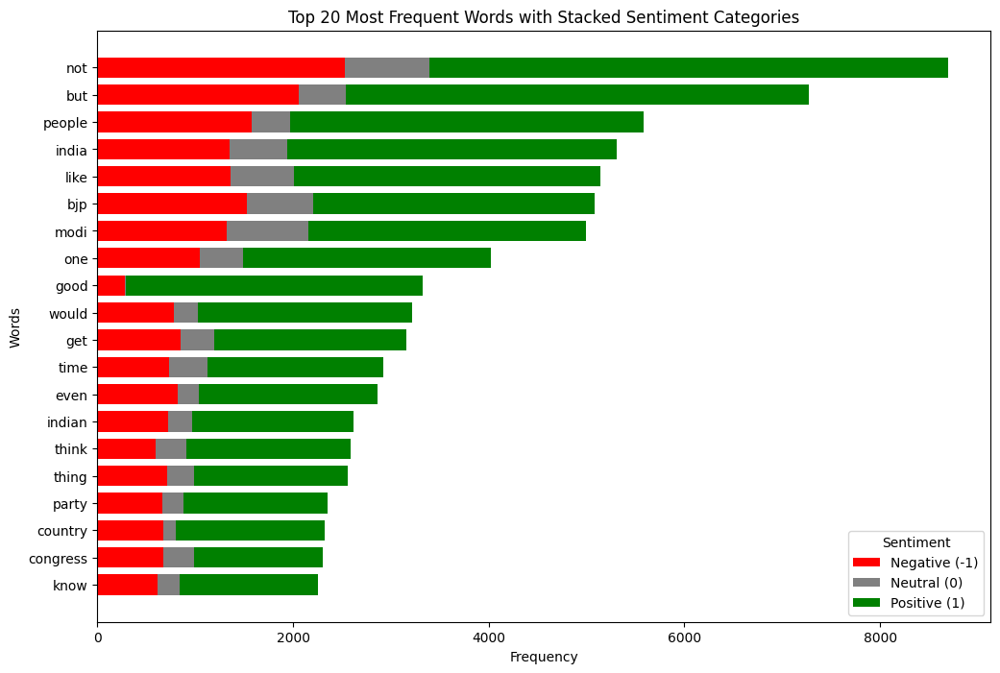

In [128]:
def plot_top_n_words_by_category(df, n=20, start=0):
    """Plot the top N most frequent words in the dataset with stacked hue based on sentiment category."""
    # Flatten all words in the content column and count their occurrences by category
    word_category_counts = {}

    for idx, row in df.iterrows():
        words = row["clean_comment"].split()
        category = row["category"]  # Assuming 'category' column exists for -1, 0, 1 labels

        for word in words:
            if word not in word_category_counts:
                word_category_counts[word] = {
                    -1: 0,
                    0: 0,
                    1: 0,
                }  # Initialize counts for each sentiment category

            # Increment the count for the corresponding sentiment category
            word_category_counts[word][category] += 1

    # Get total counts across all categories for each word
    total_word_counts = {
        word: sum(counts.values()) for word, counts in word_category_counts.items()
    }

    # Get the top N most frequent words across all categories
    most_common_words = sorted(total_word_counts.items(), key=lambda x: x[1], reverse=True)[
        start : start + n
    ]
    top_words = [word for word, _ in most_common_words]

    # Prepare data for plotting
    word_labels = top_words
    negative_counts = [word_category_counts[word][-1] for word in top_words]
    neutral_counts = [word_category_counts[word][0] for word in top_words]
    positive_counts = [word_category_counts[word][1] for word in top_words]

    # Plot the stacked bar chart
    plt.figure(figsize=(12, 8))
    bar_width = 0.75

    # Plot negative, neutral, and positive counts in a stacked manner
    plt.barh(word_labels, negative_counts, color="red", label="Negative (-1)", height=bar_width)
    plt.barh(
        word_labels,
        neutral_counts,
        left=negative_counts,
        color="gray",
        label="Neutral (0)",
        height=bar_width,
    )
    plt.barh(
        word_labels,
        positive_counts,
        left=[i + j for i, j in zip(negative_counts, neutral_counts)],
        color="green",
        label="Positive (1)",
        height=bar_width,
    )

    plt.xlabel("Frequency")
    plt.ylabel("Words")
    plt.title(f"Top {n} Most Frequent Words with Stacked Sentiment Categories")
    plt.legend(title="Sentiment", loc="lower right")
    plt.gca().invert_yaxis()  # Invert y-axis to show the highest frequency at the top
    plt.show()


plot_top_n_words_by_category(df, n=20)